In [1]:
#!conda install nodejs
#!conda install npm
#!jupyter labextension install @jupyterlab/plotly-extension

In [1]:
import matplotlib.pyplot as plt
import tweepy as tw
import pandas as pd
import numpy as np
import seaborn as sns
import plotly
import pylab
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from datetime import date
from persiantools.jdatetime import JalaliDate
import datetime
from sklearn import linear_model
import itertools
%matplotlib inline
plotly.offline.init_notebook_mode(connected=True)

In [2]:
consumer_key= 'aUNGpEs5DWI4wl9BzPMEMv8HC'
consumer_secret= 'NPBfLvu6szwjWiscildSN5UxUaH27zaXXjovqFnFCJsNQnkJK3'
access_token= '985209912-HZKuaavRsNL3L6SO02Kdjnln0WmdwKXtbsbzKgQ3'
access_token_secret= 'e98hZIIGBvcxmMbzf6xIbe021hLObt3ZMyGV81j918lKb'

In [3]:
auth = tw.OAuthHandler(consumer_key, consumer_secret)
auth.set_access_token(access_token, access_token_secret)
api = tw.API(auth, wait_on_rate_limit=True)

In [4]:
def get_today(calendar):
        today_persian = JalaliDate.today()
        today_english = date.today()
        if(calendar == 'en'):
            return today_english
        else:
            return today_persian

In [5]:
search_words = "ligo"
date_since = "2010-08-23"

In [347]:
# Collect tweets
#target_id = ['BernieSanders', 'PeteButtigieg', 'marwilliamson', 'MichaelBennet',
#             'JoeBiden', 'BilldeBlasio', 'CoryBooker', 'GovernorBullock', 'JulianCastro',
#            'JohnDelaney', 'TulsiGabbard', 'RealSaavedra', 'KamalaHarris', 'BetoORourke',
#            'TimRyan', 'ewarren', 'AndrewYang', 'GovBillWeld', 'realDonaldTrump', 'KimKardashian']

#target_id = ['BernieSanders', 'PeteButtigieg', 'JoeBiden', 'KamalaHarris', 'ewarren', 'GovBillWeld', 'realDonaldTrump']
#target_id = ['azarijahromi' , 'LesterHoltNBC', 'PahlaviReza']
#target_id = ['khamenei_ir', 'realDonaldTrump', 'TheTweetOfGod']
#target_id = ['BillGates', 'JeffBezos', 'tim_cook', 'elonmusk', 'jack', 'WarrenBuffett']
#target_id = ['smirshekari', 'masassali', 'smartismm']
#target_id = ['AfsharMahnaz', 'siamakansarii', 'sinavaliollah', 't_alidoosti', 'LalehSabouri']

target_id = ['radiomarz', 'LalehAbr', 'ChakoshP', 'hellitalk', 'album_podcast', 'thisisonpodcast', 'chirook_podcast', 'hezaro_com', 'Shenotocast',
             'radiobudio', 'channelBpodcast', 'KoronPodcast', 'readingferdowsi', 'ThisAmerLife', 'KimKardashian', 'AfsharMahnaz']

#target_id = ['BernieSanders', 'PeteButtigieg']
#target_id = ['AstroKatie', 'michiokaku', 'IBJIYONGI', 'AtheneDonald', 'duetosymmetry', 'seanmcarroll']
#target_id = ['J1nne', 'goorbachof1', 'aseyedp']
#target_id = ['manototv', 'bbcpersian', 'VOAIran', 'IranIntl', 'dw_persian', 'PressTV', 'RadioFarda_', 'isna_farsi',
#            'ilnanews', 'IrnaEnglish', 'FarsNews_Agency', 'IsraelPersian', 'israelipm_farsi', 'MehrnewsCom',
#            'Tasnimnews_Fa']
#target_id = ['FcEsteghlal', 'PersepolisFC', 'FooladFC']
#target_id = ['CNN', 'ABC', 'NBCNews', 'FoxNews', 'MSNBC', 'CBS',
#             'realDonaldTrump', 'JoeBiden', 'GovBillWeld', 'BernieSanders']


#target_id = ['Bayer4Crops', 'ChannelSeed', 'Asgrow_DEKALB', 'PioneerSeeds', 'Inari_Ag', 'AgriGold', 'BecksHybrids', 'WyffelsHybrids']

#target_id = ['RossouwJD', 'mikejgraham1', 'bobsreiter', 'BrettBegemann', 'SheilahEmilie', 'JesusMadrazo', 'RobbFraley',
#                'mikestern_ag', 'KimKardashian']

#target_id = ['Cardinals', 'StLouisBlues', 'MLS4theLou']
#target_id = ['JustinTrudeau', 'EmmanuelMacron', 'PaoloGentiloni', 'GiuseppeConteIT',
#             'AbeShinzo', 'BorisJohnson', 'eucopresident', 'narendramodi']

#target_id = ['SteveTempleton', 'KentEhrhardt', 'scottontvKSDK', 'zimmtv']

#target_id = ['TheDailyShow', 'Trevornoah', 'colbertlateshow', 'StephenAtHome', 'latelateshow', 'JKCorden',
#             'LateNightSeth', 'sethmeyers', 'LastWeekTonight', 'iamjohnoliver', 'KimKardashian']

#target_id = ['ideasgotogrow', 'MonmouthLC', 'TheHuxleyLC', 'Bayer', 'BayerPharma', 'Bayer4CropsUS',
#             'Bayer4Crops', 'BayerKarriere', 'BayerUS', 'Bayer4CropsCA', 'Bayer4SelfCare', 'BayerConoSur',
#             'BayerEspana', 'BayerPresse_DE', 'GesundheitBayer', 'Bayer_FR']

#target_id = ['Google', 'Apple', 'amazon', 'Microsoft', 'facebook', 'intel', 'netflix', 'HBO', 'hulu', 'Twitter']

#target_id = ['VP', 'KimKardashian']

target_calendar = 'en'
bucket = 999

tweets = {}
last_tweet = {}

for username in target_id:
    tweets[username] = tw.Cursor(api.user_timeline, id=username,
                  #q=search_words,
                  lang= target_calendar,
                  since=date_since).items(bucket)

    last_tweet[username] = tw.Cursor(api.user_timeline, id=username,
                  #q=search_words,
                  lang= target_calendar,
                  since=date_since).items(1)

today = get_today(target_calendar)

In [348]:
# Iterate on tweets
profile_ax = {}
users_locs = {}
tweet_text = {}
tweet_text_clean = {}

for username in target_id:
    profile_ax[username] = [tweet.user.profile_image_url_https for tweet in last_tweet[username]]

    users_locs[username] = [[tweet.text, 
                   tweet.created_at, tweet.user.name, tweet.user.screen_name, tweet.user.location,
                   tweet.is_quote_status, tweet.favorite_count, tweet.retweet_count,
                   tweet.user.followers_count] for tweet in tweets[username]]
    
    tweet_text[username] = pd.DataFrame(data=users_locs[username], 
                    columns=['text', 
                             'datetime', 'name', 'screen_name', 'location',
                             'is_quote_status', 'favorite_count', 'retweet_count',
                             'followers_count'])
    
    tweet_text[username]['favorite_count_by_follower'] =  tweet_text[username]['favorite_count']/tweet_text[username]['followers_count']*1000
    tweet_text[username]['retweet_count_by_follower']  =  tweet_text[username]['retweet_count']/tweet_text[username]['followers_count']*1000

    #tweet_text_clean[username] = tweet_text[username]
    tweet_text_clean[username] = tweet_text[username].loc[(tweet_text[username]['retweet_count'] != 0) & (tweet_text[username]['favorite_count'] != 0),:].reset_index()
#users_locs

In [349]:
for username in target_id:
    print(username, ': ', tweet_text[username].shape)

radiomarz :  (396, 11)
LalehAbr :  (999, 11)
ChakoshP :  (186, 11)
hellitalk :  (999, 11)
album_podcast :  (999, 11)
thisisonpodcast :  (621, 11)
chirook_podcast :  (448, 11)
hezaro_com :  (154, 11)
Shenotocast :  (999, 11)
radiobudio :  (347, 11)
channelBpodcast :  (999, 11)
KoronPodcast :  (167, 11)
readingferdowsi :  (999, 11)
ThisAmerLife :  (999, 11)
KimKardashian :  (999, 11)
AfsharMahnaz :  (999, 11)


In [350]:
for username in target_id:
    print(username, ': ', tweet_text_clean[username].shape)

radiomarz :  (55, 12)
LalehAbr :  (37, 12)
ChakoshP :  (33, 12)
hellitalk :  (152, 12)
album_podcast :  (129, 12)
thisisonpodcast :  (112, 12)
chirook_podcast :  (38, 12)
hezaro_com :  (64, 12)
Shenotocast :  (203, 12)
radiobudio :  (232, 12)
channelBpodcast :  (290, 12)
KoronPodcast :  (16, 12)
readingferdowsi :  (139, 12)
ThisAmerLife :  (611, 12)
KimKardashian :  (706, 12)
AfsharMahnaz :  (374, 12)


In [351]:
target_id = list(set(target_id) - set(['Apple']))

In [352]:
for username in target_id:
    print(profile_ax[username][0])

https://pbs.twimg.com/profile_images/1097320761117704192/aMVddS1P_normal.jpg
https://pbs.twimg.com/profile_images/1086177823008673792/OO-eBtBO_normal.jpg
https://pbs.twimg.com/profile_images/1072178306924113921/pJPl8a1F_normal.jpg
https://pbs.twimg.com/profile_images/1153388298418688005/Yzb4ueAY_normal.jpg
https://pbs.twimg.com/profile_images/809766894685290496/NeGpJu7W_normal.jpg
https://pbs.twimg.com/profile_images/1136020407738404865/fu-1zh7Y_normal.jpg
https://pbs.twimg.com/profile_images/1018118542493876224/EqTTWbBf_normal.jpg
https://pbs.twimg.com/profile_images/876728899455111168/S-DJVW1L_normal.jpg
https://pbs.twimg.com/profile_images/951846376249479169/KoS5xoCW_normal.jpg
https://pbs.twimg.com/profile_images/1145812709960667136/YF4VoP3e_normal.jpg
https://pbs.twimg.com/profile_images/1057476542970900480/PeAIANdo_normal.jpg
https://pbs.twimg.com/profile_images/1082897589337538560/cK-xJuoP_normal.jpg
https://pbs.twimg.com/profile_images/1109927843230814208/4Q0a5VtQ_normal.png
ht

In [353]:
followers_dic = {}
for username in target_id:
    followers_dic[username] = (tweet_text_clean[username]['followers_count'][0])

In [354]:
min_followers_count = min(list(followers_dic.values()))
min_followers_count

805

In [355]:
fig_marker_trend = go.Figure()
x_pos = 0
images = []
colors = sns.color_palette("hls", n_colors=len(target_id))

for username, color in zip(target_id, colors):
    x_pos = x_pos + 0.070
    image = dict(
            source=profile_ax[username][0],
            xref="paper", yref="paper",
            x= x_pos, y=.9,
            sizex=0.1, sizey=0.1,
            xanchor="right", yanchor="bottom"
        )
    images.append(image)

    fig_marker_trend.update_layout(
        images=images
    )

    
####### update_layout
fig_marker_trend.update_layout(
    title=go.layout.Title(
        text= ' <b>Twitter Fame & Popularity Indices</b> <br>The last '+ str(bucket) +  ' tweets as of ' +  str(today)+
        '<br> sendBlamesTo:<a href="https://twitter.com/smirshekari">@smirshekari</a>',
        xref="paper",
        x=0
    ),
    xaxis=go.layout.XAxis(
        title=go.layout.xaxis.Title(
            text="♻️ Retweet Counts [per 1000 followers]",
            font=dict(
                family="Courier New, monospace",
                size=18,
                color="#7f7f7f"
            )
        )
    ),
    yaxis=go.layout.YAxis(
        title=go.layout.yaxis.Title(
            text="❤️ Favorite Counts [per 1000 followers]",
            font=dict(
                family="Courier New, monospace",
                size=18,
                color="#7f7f7f"
            )
        )
    )
    ,xaxis_type="log", yaxis_type="log"
)

for username, color in zip(target_id, colors):
    
    data_x = (pd.DataFrame({'X':tweet_text_clean[username]['retweet_count_by_follower']}))
    data_y = (pd.DataFrame({'Y':tweet_text_clean[username]['favorite_count_by_follower']}))
    rt_mean = data_x.mean()
    fv_mean = data_y.mean()
    
    data = pd.DataFrame({'X':data_x['X'], 'Y':data_y['Y']}).sort_values(by = 'X')
    
    fig_marker_trend.add_trace(
        go.Scatter(
            x=data_x['X'],
            y=data_y['Y'],
            marker_color= 'rgb'+str(color),
            text= tweet_text_clean[username]['text'],
            mode='markers',
            name=username+'_tweets',
            visible = "legendonly"
        ))

    fig_marker_trend.add_trace(
        go.Scatter(
            x=rt_mean,
            y=fv_mean,
            marker=dict(size= np.log(followers_dic[username]/min_followers_count)*10,
                        line_width=2,
                        line_color='black',
                        color='rgb'+str(color)
                       ),
            
            text= tweet_text_clean[username]['name'],#+'<br>#followers: '+ str(followers_dic[username]),
            mode='markers+text',
            name=username+'_poplarity',
            textposition="top center"
        ))
    
    # Create linear regression object
    regr = linear_model.LinearRegression()

    # Train the model using the training sets
    regr.fit(data.X[:,np.newaxis], data['Y'])
    
    fig_marker_trend.add_trace(
            go.Scatter(x=data['X'], 
                        y=regr.predict(pd.DataFrame(data['X'])),
                        mode='lines',
                        line=dict(color='rgb'+str(color), width=2),
                        name=username+'_trend',
                        visible = "legendonly"
                      ))

In [356]:
fig_marker_trend.write_html('./farsi_podcast.html', auto_open=True)


In [252]:
followers_dic

{'RossouwJD': 611,
 'mikejgraham1': 1526,
 'bobsreiter': 2211,
 'BrettBegemann': 1626,
 'SheilahEmilie': 1055,
 'JesusMadrazo': 2877,
 'RobbFraley': 14308,
 'mikestern_ag': 1461,
 'KimKardashian': 61690624}

In [149]:
fig1 = go.Figure()
x_pos = 0
images = []
colors = sns.color_palette("hls", n_colors=len(target_id))

def data_to_plotly(x):
    k = []
    
    for i in range(0, len(x)):
        k.append(x[i][0])
        
    return k

for username, color in zip(target_id, colors):
    x_pos = x_pos + 0.070
    image = dict(
            source=profile_ax[username][0],
            xref="paper", yref="paper",
            x= x_pos, y=.9,
            sizex=0.1, sizey=0.1,
            xanchor="right", yanchor="bottom"
        )
    images.append(image)
    
    data_x = pd.DataFrame({'X':tweet_text_clean[username]['retweet_count_by_follower']})
    data_y = pd.DataFrame({'Y':tweet_text_clean[username]['favorite_count_by_follower']})

    fig1.update_layout(
        images=images
    )

    fig1.add_trace(
        go.Scatter(
            x=data_x['X'],
            y=data_y['Y'],
            marker_color= 'rgb'+str(color),
            text= tweet_text_clean[username]['text'],
            mode='markers',
            name='markers_'+username
        ))

        
####### update_layout
fig1.update_layout(
    title=go.layout.Title(
        text= '<br>The last '+ str(bucket) +  ' tweets as of ' +  str(today),
        xref="paper",
        x=0
    ),
    xaxis=go.layout.XAxis(
        title=go.layout.xaxis.Title(
            text="♻️ Retweet Counts [per 1000 followers]",
            font=dict(
                family="Courier New, monospace",
                size=18,
                color="#7f7f7f"
            )
        )
    ),
    yaxis=go.layout.YAxis(
        title=go.layout.yaxis.Title(
            text="❤️ Favorite Counts [per 1000 followers]",
            font=dict(
                family="Courier New, monospace",
                size=18,
                color="#7f7f7f"
            )
        )
    ),
xaxis_type="log", yaxis_type="log")

#fig1.update_xaxes(type="log")
#fig1.update_yaxes(type="log")
fig1.write_html('first_figure.html', auto_open=True)

In [72]:
fig_marker_trend.write_html('/Users/smirshekari/git_repositories/smirs.github.io/g7.html')


In [86]:
fig_trend = go.Figure()
x_pos = 0
images = []
colors = sns.color_palette("muted", n_colors=len(target_id))

for username, color in zip(target_id, colors):
    x_pos = x_pos + 0.070
    image = dict(
            source=profile_ax[username][0],
            xref="paper", yref="paper",
            x= x_pos, y=.9,
            sizex=0.1, sizey=0.1,
            xanchor="right", yanchor="bottom"
        )
    images.append(image)
    
    data_x = pd.DataFrame({'X':tweet_text_clean[username]['retweet_count_by_follower']})
    data_y = pd.DataFrame({'Y':tweet_text_clean[username]['favorite_count_by_follower']})

    fig_trend.update_layout(
        images=images
    )


    
####### update_layout
fig_trend.update_layout(
    title=go.layout.Title(
        text= '<br>The last '+ str(bucket) +  ' tweets as of ' +  str(today),
        xref="paper",
        x=0
    ),
    xaxis=go.layout.XAxis(
        title=go.layout.xaxis.Title(
            text="♻️ Retweet Counts [per 1000 followers]",
            font=dict(
                family="Courier New, monospace",
                size=18,
                color="#7f7f7f"
            )
        )
    ),
    yaxis=go.layout.YAxis(
        title=go.layout.yaxis.Title(
            text="❤️ Favorite Counts [per 1000 followers]",
            font=dict(
                family="Courier New, monospace",
                size=18,
                color="#7f7f7f"
            )
        )
    ),
xaxis_type="log", yaxis_type="log")

for username, color in zip(target_id, colors):
    
    data_x = (pd.DataFrame({'X':tweet_text_clean[username]['retweet_count_by_follower']}))
    data_y = (pd.DataFrame({'Y':tweet_text_clean[username]['favorite_count_by_follower']}))
    data = pd.DataFrame({'X':data_x['X'], 'Y':data_y['Y']}).sort_values(by = 'X')
    
    # Create linear regression object
    regr = linear_model.LinearRegression()

    # Train the model using the training sets
    regr.fit(data.X[:,np.newaxis], data['Y'])
    
    fig_trend.add_trace(
            go.Scatter(x=data['X'], 
                        y=regr.predict(pd.DataFrame(data['X'])),
                        mode='lines',
                        line=dict(color='rgb'+str(color), width=2),
                        name=username
                      ))
fig_trend.show()

In [421]:
fig_trend.write_html('/Users/smirs/git_projects/smirs.github.io/'+str(today.year)+'_'+str(today.month)+'_'+str(today.day)+'_'+
                '_'.join(target_id)+'trend_01.html')


In [30]:
fig_marker_trend.write_html('/Users/smirshekari/git_repositories/smirs.github.io/monsanto.html')

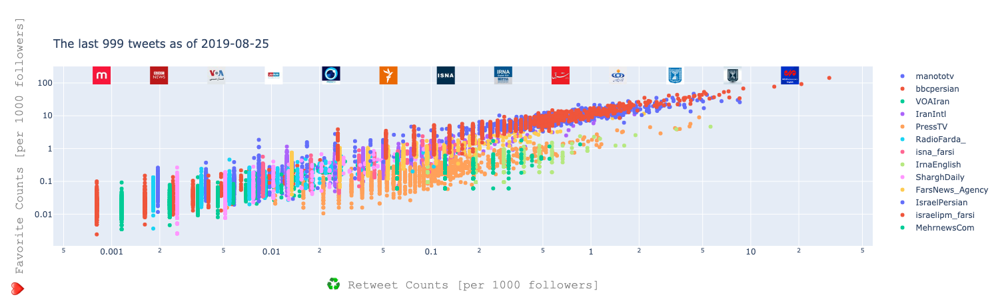

In [403]:
fig1 = go.Figure()
x_pos = 0
images = []

def data_to_plotly(x):
    k = []
    
    for i in range(0, len(x)):
        k.append(x[i][0])
        
    return k

for username in target_id:
    x_pos = x_pos + 0.070
    image = dict(
            source=profile_ax[username][0],
            xref="paper", yref="paper",
            x= x_pos, y=.9,
            sizex=0.1, sizey=0.1,
            xanchor="right", yanchor="bottom"
        )
    images.append(image)

    fig1.update_layout(
        images=images
    )
    
    data_x = pd.DataFrame({'X':tweet_text_clean[username]['retweet_count_by_follower']})
    data_y = pd.DataFrame({'Y':tweet_text_clean[username]['favorite_count_by_follower']})
    
    fig1.add_trace(
        go.Scatter(
            x=data_x['X'],
            y=data_y['Y'],
            #marker_color=tweet_text_clean[target_id[0]]['is_quote_status'],
            text= tweet_text_clean[username]['text'],
            mode='markers',
            name=username
        ))

####### update_layout
fig1.update_layout(
    title=go.layout.Title(
        text= '<br>The last '+ str(bucket) +  ' tweets as of ' +  str(today),
        xref="paper",
        x=0
    ),
    xaxis=go.layout.XAxis(
        title=go.layout.xaxis.Title(
            text="♻️ Retweet Counts [per 1000 followers]",
            font=dict(
                family="Courier New, monospace",
                size=18,
                color="#7f7f7f"
            )
        )
    ),
    yaxis=go.layout.YAxis(
        title=go.layout.yaxis.Title(
            text="❤️ Favorite Counts [per 1000 followers]",
            font=dict(
                family="Courier New, monospace",
                size=18,
                color="#7f7f7f"
            )
        )
    )
)

fig1.update_xaxes(type="log")
fig1.update_yaxes(type="log")

In [404]:
fig1.write_html('/Users/smirs/git_projects/smirs.github.io/'+str(today.year)+'_'+str(today.month)+'_'+str(today.day)+'_'+
                '_'.join(target_id)+'_01.html')

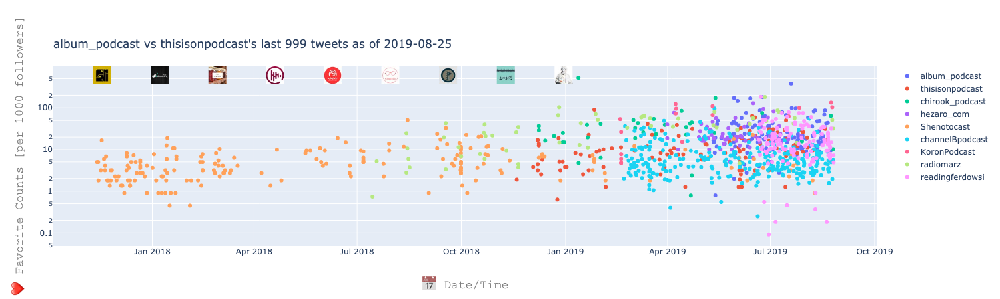

In [267]:
fig2 = go.Figure()
x_pos = 0
images = []

for username in target_id:
    x_pos = x_pos + 0.070
    image = dict(
            source=profile_ax[username][0],
            xref="paper", yref="paper",
            x= x_pos, y=.9,
            sizex=0.1, sizey=0.1,
            xanchor="right", yanchor="bottom"
        )
    images.append(image)
    fig2.add_trace(
        go.Scatter(
            x=tweet_text_clean[username]['datetime'],
            y=tweet_text_clean[username]['favorite_count_by_follower'],
            #marker_color=tweet_text_clean[target_id[0]]['is_quote_status'],
            text= tweet_text_clean[username]['text'],
            mode='markers',
            name=username
        ))

    fig2.update_layout(
        images=images
    )



####### update_layout
fig2.update_layout(
    title=go.layout.Title(
        text= '<br>'+ target_id[0] + ' vs ' + target_id[1] + '\'s last '+ str(bucket) +  ' tweets as of ' +  str(today),
        xref="paper",
        x=0
    ),
    xaxis=go.layout.XAxis(
        title=go.layout.xaxis.Title(
            text="📅 Date/Time",
            font=dict(
                family="Courier New, monospace",
                size=18,
                color="#7f7f7f"
            )
        )
    ),
    yaxis=go.layout.YAxis(
        title=go.layout.yaxis.Title(
            text="❤️ Favorite Counts [per 1000 followers]",
            font=dict(
                family="Courier New, monospace",
                size=18,
                color="#7f7f7f"
            )
        )
    )
)

fig2.update_yaxes(type="log")

In [268]:
fig2.write_html('/Users/smirs/git_projects/smirs.github.io/'+'_'.join(target_id)+'_02.html')

'BernieSanders_PeteButtigieg_JoeBiden_KamalaHarris_ewarren_GovBillWeld_realDonaldTrump'

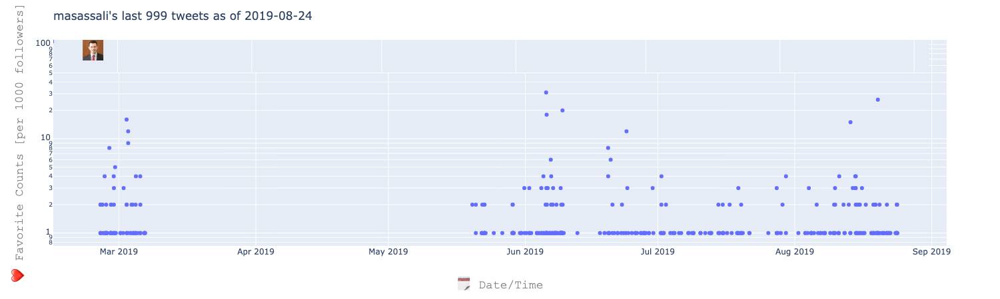

In [358]:
fig2 = px.scatter(tweet_text, x='datetime', y='favorite_count',# color='is_quote_status',
                 #size='petal_length',
                 marginal_x="rug",
                 hover_data=['text'])
####### update_layout
fig2.update_layout(
    images=[dict(
        source=profile_ax[0],
        xref="paper", yref="paper",
        x=.056, y=.9,
        sizex=0.1, sizey=0.1,
        xanchor="right", yanchor="bottom"
    )],
)
####### update_layout
fig2.update_layout(
    title=go.layout.Title(
        text= target_id + '\'s last '+ str(bucket) +  ' tweets as of ' +  str(today),
        xref="paper",
        x=0
    ),
    xaxis=go.layout.XAxis(
        title=go.layout.xaxis.Title(
            text="🗓️ Date/Time",
            font=dict(
                family="Courier New, monospace",
                size=18,
                color="#7f7f7f"
            )
        )
    ),
    yaxis=go.layout.YAxis(
        title=go.layout.yaxis.Title(
            text="❤️ Favorite Counts [per 1000 followers]",
            font=dict(
                family="Courier New, monospace",
                size=18,
                color="#7f7f7f"
            )
        )
    )
)

fig2.update_yaxes(type="log")


In [359]:
fig2.write_html('/Users/smirs/git_projects/smirs.github.io/'+target_id+'_02.html')

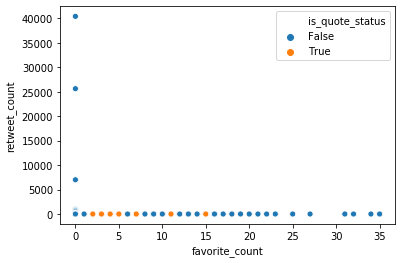

In [36]:
sns.scatterplot(x = 'favorite_count', y = 'retweet_count', hue="is_quote_status", data = tweet_text)

In [ ]:
ax = tweet_text.plot(x='datetime', y=['favorite_count', 'retweet_count'], style = '.', figsize=(20,10))

In [10]:
a = tweet_text.loc[tweet_text.retweet_count > 200000, ['text', 'datetime', 'favorite_count', 'retweet_count', 'is_quote_status']].sort_values(by = ['favorite_count'], ascending = False)
a

,text,datetime,favorite_count,retweet_count,is_quote_status
456,A$AP Rocky released from prison and on his way...,2019-08-02 17:41:30,880193,251783,False
739,Just spoke to @KanyeWest about his friend A$AP...,2019-07-19 20:01:47,734321,206108,False
730,RT @realDonaldTrump: Just spoke to @KanyeWest ...,2019-07-20 11:02:22,0,206108,False


In [11]:
a = tweet_text.loc[tweet_text.favorite_count > 380000, ['text', 'datetime', 'favorite_count', 'retweet_count', 'is_quote_status']].sort_values(by = ['favorite_count'], ascending = False)
a

,text,datetime,favorite_count,retweet_count,is_quote_status
456,A$AP Rocky released from prison and on his way...,2019-08-02 17:41:30,880193,251783,False
739,Just spoke to @KanyeWest about his friend A$AP...,2019-07-19 20:01:47,734321,206108,False


In [12]:
iris = px.data.iris()
iris.head()

,sepal_length,sepal_width,petal_length,petal_width,species,species_id
0,5.1,3.5,1.4,0.2,setosa,1
1,4.9,3.0,1.4,0.2,setosa,1
2,4.7,3.2,1.3,0.2,setosa,1
3,4.6,3.1,1.5,0.2,setosa,1
4,5.0,3.6,1.4,0.2,setosa,1


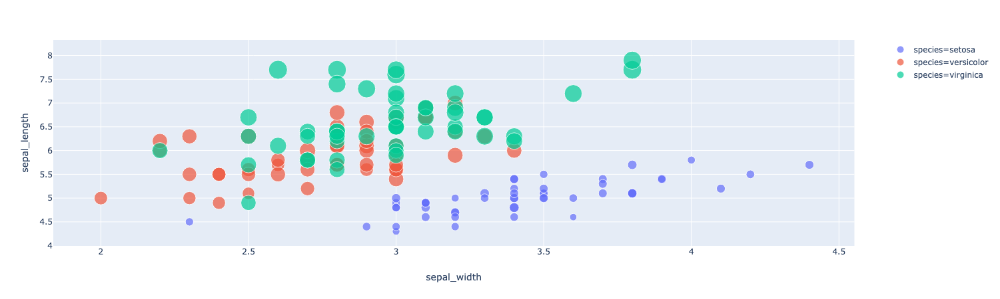

In [13]:
fig = px.scatter(iris, x="sepal_width", y="sepal_length", color="species",
                 size='petal_length', hover_data=['petal_width'])
fig.show()

In [22]:
init_notebook_mode(connected=True)
import plotly.express as px

gapminder_2007 = px.data.gapminder().query("year==2007")

fig = px.scatter(gapminder_2007, x="gdpPercap", y="lifeExp", log_x=True,
                 hover_name="country", hover_data=["continent"])

fig.show()

NameError: name 'init_notebook_mode' is not defined

In [23]:
!jupyter labextension install @jupyterlab/plotly-extension

An error occured.
ValueError: Please install nodejs 5+ and npm before continuing installation. nodejs may be installed using conda or directly from the nodejs website.
See the log file for details:  /var/folders/vr/rwddcpxs2v370x4g16zj0qljg33jnn/T/jupyterlab-debug-i0tkdssw.log
